## Getting started with Image Processing 

As the name suggests, image processing can simply be defined as processing (analyzing and
manipulating) of images with algorithms in a computer (through code). It has a few
different aspects, such as storage, representation, information extraction, manipulation,
enhancement, restoration and interpretation of images. In this chapter, we are going to
have a basic introduction on all these different aspects of image processing along with an
introduction to hands-on image-processing with python libraries. We are going to use
python 3 for all the code samples in this book.

We shall start by defining what is image processing and what are the applications of image
processing. Then we shall learn about the basic image processing pipeline, i.e., what are the
steps to process an image on a computer in general. Then we shall learn about different
python libraries available for image processing and how to install them in python 3. Next
we shall learn how to write python codes to read and write (store) images in a computer
using different libraries. After that, we shall learn the data structures that are to be used to
represent an image in python and how to display an image. We shall also learn different
image types, different image file formats and finally how to do basic image manipulations
in python.

By the end of this chapter, we should be able to conceptualize image processing, different
steps and different applications. We should be able to import and call functions from
different image processing libraries in python. We should be able to understand the data
structures used to store different types of images in python, read / write image files using
different python libraries and write python code to do basic image manipulations. The
topics to be covered in this chapter are structured as shown below.

(<matplotlib.image.AxesImage at 0x14a436ce400>, (-0.5, 845.5, 639.5, -0.5))

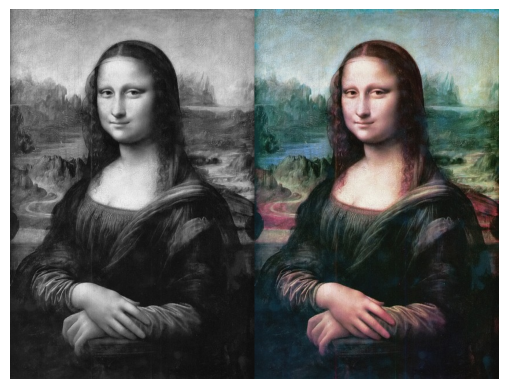

In [226]:
from skimage.color import gray2rgb, rgb2gray

im = plt.imread('images/monalisa.jpg')
im = im / im.max()
plt.imshow(np.hstack((gray2rgb(rgb2gray(im)), im))), plt.axis('off') 

### 2. The Image processing pipeline

The following steps describe the basic steps in the image processing pipeline.

1. Acquisition / Storage: First the image needs to be captured (using camera, e.g.) and stored on some device (hard disk, e.g.) as a file (a jpeg file, e.g.).

2. Load into memory / Save to disk: from disk the needs to be read into memory and stored using some data structure (numpy ndarray, e.g.) and the data structure needs to be serialized to an image file later, possibly after running some algorithms on the image.

3. Manipulation, Enhancement, Restoration: We need to run some preprocessing algorithms to run a few transformations on the image (sampling, manipulation, e.g., gray-scale conversion) enhance the quality of the image (filtering, e.g., deblurring)
restore the image from noise degradation.

4. Segmentation: Next the image needs to be segmented in order to extract the objects of interest.

5. Information Extraction / Representation: Then the image needs to be represented in some alternative form, for example,
Some hand-crafted feature-descriptor can be computed (e.g., HOG descriptors, with classical image processing) from the image. Some features can be automatically learned from the image (e.g., the weights and bias values learnt in the hidden layers of a neural-net, with deep learning). The image is going to be represented using that alternative representation.

6. Image Understanding / Interpretation: This representation will be used to understand the image better with image classification (e.g.,whether an image contains a human object or not) object recognition (e.g., find the location of the car objects in an image with a bounding box)

The following figure describes different steps in image processing and also the different modules that we are going to use for different image processing tasks.

![](images/im3.png)


Apart from these libraries we are going to use

* scipy.ndimage and opencv for different image processing tasks,
* scikit-learn for classical machine learning and tensorflow, keras, pytorch for deep learning.

### Setting up different Image Processing Libraries in Python

The next few paragraphs describe how to install different image processing libraries and
setup the environment for writing codes to process images using the classical image
processing techniques in python. In the last few chapters of the book, we shall need to use a
different setup when we shall use deep-learning-based methods.


### Installing pip

We are going to use the pip (or pip3) tool to install the libraries, so we need to
install pip first, in case it's not installed. As mentioned here, pip is already installed if we
use python 3 >=3.4 downloaded from python.org or if we are working in a Virtual
Environment created by virtualenv or pyvenv. Just we need to make sure to upgrade pip.
How to install pip for different OS / platforms can be found here.

### Installing Some Image Processing Libraries in Python

In python, there are many libraries which we can use for image processing. Some of the
following libraries we are going to use are as below:

* numpy
* scipy
* scikit-image
* PIL (pillow)
* wand
* opencv-python
* scikit-learn
* mahotas
* matplotlib
* seaborn

The library `matplotlib` and `seaborn` will primarily be used for display purpose, where as
numpy will be used for storing an image. The scikit-learn library will be used for building
machine-learning models for image processing, scipy will be used mainly for image
enhancements. The scikit-image, mahotas and opencv will be used for different image
processing algorithms.

The following code block shows how the libraries that we are going to use can be
downloaded and installed with pip from a python prompt (interactive mode) or in jupyter notebook:

In [1]:
!pip install numpy
!pip install scipy
!pip install scikit-image
!pip install scikit-learn
!pip install matplotlib
!pip install pillow
!pip install mahotas
!pip install opencv-python
!pip install jupyter
!pip install -U wand
!pip install blend_modes
!pip install pillow_lut
!pip install imviz[all]

There may be some additional installation instructions, depending on the OS platform one is going to use. We suggest the reader to go through the documentation sites for each of the
libraries to get a detailed platform-specific installation instructions for each library. For
example, for the scikit-image library, detailed installation instructions for different OS
platforms can be found here. Also, one should be familiar to websites such
as stackoverflow to resolve platform-dependent installation issues for different libraries.

Finally, we can verify whether a library is properly installed or not by importing it from the
python prompt. If the library is imported successfully (no error message is thrown), then
we don't have any installation issue. We can print the version of the library installed by
printing it to the console.

The following code block shows the same for the python library scikit-image.

In [1]:
import skimage
print(skimage.__version__)

0.17.2


As can be seen from above, an example output of the above code block 0.17.2.

The following code-block shows the version of PIL and numpy libraries, respectively, as a `tuple`:

In [2]:
import PIL
import numpy
PIL.__version__, numpy.__version__

('8.3.2', '1.21.6')

Let's ensure that we have the latest versions for all the libraries.

### Installing the Anaconda Distribution

We also recommend to download and install the latest version of the anaconda distribution
from here, this will eliminate the need of explicit installation of many python packages.

More about installing anaconda for different OS can be found '<here>'.
    
### Installing Jupyter Notebook

We are going to use jupyter notebooks to write our python code. So we need to install
the jupyter package first from a python prompt with>>> pip install jupyter
and then launch the jupyter notebook app in the browser using>>> jupyter notebook
where we can create new python notebooks and choose a kernel. If we use anaconda, we do
not need to install jupyter explicitly, the latest anaconda distribution comes with jupyter.

More about running jupyter notebooks can be found here.

We can even install a python package from inside a notebook cell, e.g., we can
install scipy with the command !pip install scipy

For more information on installing Jupyter please
refer: http://jupyter.readthedocs.io/en/latest/install.html    

### Image I/O and Display with Python

The images are stored as files on the disk, so reading and writing images from the files are
disk I/O operations. These can be done using many ways using different libraries, some of
them are shown below. Let's first start by importing all the required packages

In [6]:
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
from PIL import Image, ImageFont, ImageDraw, ImageFilter, ImageOps
from PIL.ImageChops import add, subtract, multiply, difference, screen, soft_light, hard_light, overlay, lighter
import PIL.ImageStat as stat
from pillow_lut import load_cube_file
from skimage import color, exposure, img_as_float, data
from skimage.io import imread, imsave, imshow, show, imread_collection, imshow_collection
from skimage.transform import SimilarityTransform, PiecewiseAffineTransform, warp, swirl, rescale, resize, downscale_local_mean
from skimage.util import view_as_blocks, invert, random_noise, montage
from skimage import measure
import scipy.ndimage as ndimage
from scipy.ndimage import affine_transform
import cv2
import wand
import blend_modes, imgviz
import numpy as np
import matplotlib.image as mpimg
import matplotlib.pylab as plt
from time import time
import os

### Reading/Saving/Displaying an image using PIL

The PIL function `open()` reads an image from disk in an Image object as shown in the code
below. The image is loaded as an object of the class `PIL.PngImagePlugin.PngImageFile` and
we can use the width, height, mode etc. properties to find the size (= width x height in
pixels, i.e., the resolution of the image) and mode of the image.

In [2]:
im = Image.open("images/parrot.png")
#im.save('../new images/parrot.png')
print(im.width, im.height, im.mode, im.format, type(im))
im.show()

453 340 RGB PNG <class 'PIL.PngImagePlugin.PngImageFile'>


In [9]:
im_g = im.convert('L')                      # convert the RGB color image to a gray-scale image
im_g.save('images/parrot_gray.png')         # save the image to disk
Image.open("images/parrot_gray.png").show() # read the gray-scale image from disk and show

The following figure show the original RGB color image and the converted gray-scale image obtained by runnign the above code snippet.

![](images/parrot_gray.png)


### Providing the correct path to the images on the disk

We shall recommend to create a folder (sub-directory) to store images to be used for
processing (e.g., for the python code samples, we have used the images stored inside a
folder images) and provide the path to the folder to access the image, to avoid file not found
exception.

In [276]:
import PIL
url = 'https://cdn.pixabay.com/photo/2014/11/30/14/11/cat-551554_640.jpg'
#headers = {"User-Agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64; rv:109.0) Gecko/20100101 Firefox/110.0"}
response = requests.get(url) #, headers=headers)

if response.status_code == 200:
    img = Image.open(BytesIO(response.content))
    img.show()
else:
    print(f"Failed to retrieve image. Status code: {response.status_code}")
    
#Image.open(BytesIO(urlopen(str('https://cdn.pixabay.com/photo/2014/11/30/14/11/cat-551554_640.jpg')).read()))

(328, 240)


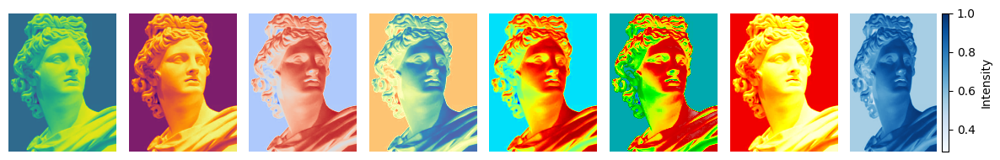

In [280]:
im = plt.imread('images/sculpture.png') 
im_gray = np.mean(im, axis=-1) 
print(im_gray.shape) 
#(256, 256) 
i = 1 
plt.figure(figsize=(12,2)) 
for cmap in ['viridis', 'inferno', 'coolwarm', 'Spectral', 'jet', \
             'nipy_spectral', 'hot', 'Blues']: 
    plt.subplot(1,8,i), plt.imshow(im_gray, cmap=cmap, aspect='auto')  
    plt.axis('off') 
    i += 1 
plt.colorbar(label='Intensity') 
plt.tight_layout() 
plt.show() 

### Reading/Saving/Displaying an image using Matpotlib

### with matplotlib.image

The next code block shows how to use the function `imread()` from `matplotlib.image` to read an image in a floating-point numpy ndarray. The pixel values will be represented as real values between 0 and 1. The following figure shows the output of the above code.

In [7]:
im = mpimg.imread("images/hill.png")  # read the image from disk as a numpy ndarray
print(im.shape, im.dtype, type(im))      # this image contains an α channel, hence num_channels = 4

(960, 1280, 3) float32 <class 'numpy.ndarray'>


The next code fragment changes the image to a darker image by first setting all the pixel values below 0.5 to 0
and then saving the `numpy` ndarray to disk. The saved image is again reloaded and displayed. The next figure shows the darker image saved with the above code. Note that we have used the `imsave()` function from `matplotlib.image` module to save the darkened image to disk.

1.0


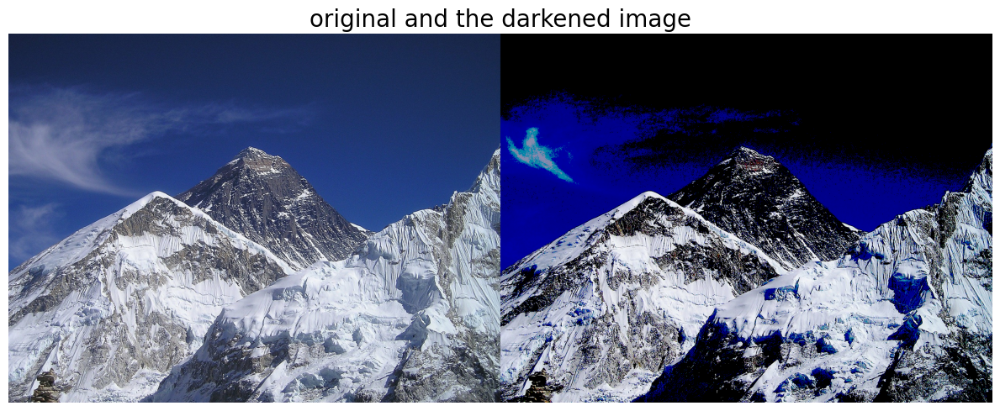

In [8]:
im_dark = im.copy() 
print(np.max(im))
im_dark[im_dark < 0.5] = 0    # make the image look darker
mpimg.imsave("images/hill_dark.png", im_dark)  # save the dark image

im_dark = mpimg.imread("images/hill_dark.png")[...,:3] # read the dark image, first 3 color channels
plt.figure(figsize=(12,5))
plt.imshow(np.hstack((im, im_dark))), plt.axis('off'), plt.title('original and the darkened image', size=20)
plt.tight_layout()
plt.show()

You could use the `savefig()` function from `matplotlib.pylab` too to save an image to the disk, but you need to plot it using the `imshow()` function before saving.

### Interpolating while displaying with matplotlib imshow

The `imshow()` function from matplotlib provides many different types of interpolation
methods to plot an image. These functions can be particularly useful when the image to be
plotted is small. Let us use the small 50 x 50 lena image shown in the next figure to see the
effects of plotting with different interpolation methods. The next code block demonstrates how to use different interpolation methods with `imshow()`. The next figure shows the output of the above code. The next figure shows the output of the above code.

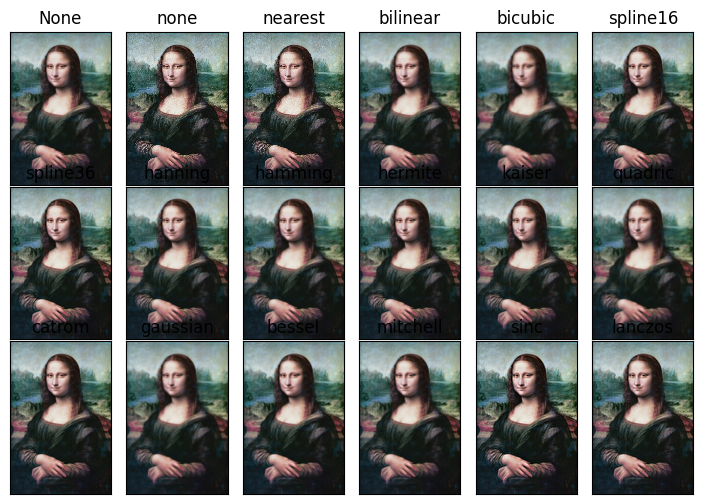

In [14]:
im = mpimg.imread("images/monalisa.jpg") # read the image from disk as a numpy ndarray
methods = [None, 'none', 'nearest', 'bilinear', 'bicubic', 'spline16',
'spline36', 'hanning', 'hamming', 'hermite', 'kaiser', 'quadric',
'catrom', 'gaussian', 'bessel', 'mitchell', 'sinc', 'lanczos']
fig, axes = plt.subplots(nrows=3, ncols=6, figsize=(9, 6),
subplot_kw={'xticks': [], 'yticks': []})
fig.subplots_adjust(hspace=0.01, wspace=0.01)
for ax, interp_method in zip(axes.flat, methods):
    ax.imshow(im, interpolation=interp_method)
    ax.set_title(str(interp_method))
#plt.tight_layout()
plt.show()

### Reading/Saving/Displaying an image using scikit-image

The next code block uses the `imread()` function from `scikit-image` to read an image in a numpy
ndarray of type uint8 (8bit unsigned integer). Hence, the pixel values will be in between 0 to
255. Then it converts (changes the image type or mode which will be discussed shortly) the
colored RGB image to an HSV image using the function `hsv2rgb()` from the Image.color
module. Next it changes the saturation (colorfulness) to a constant value for all the pixels
by keeping the hue and value channels unchanged. The image is then converted back to
RGB mode with 1rgb2hsv()` function to create a new image, which is then saved and
displayed. The next figure shows the output of the above code, the new image with changed
saturation.

(340, 453, 3) uint8 <class 'numpy.ndarray'>


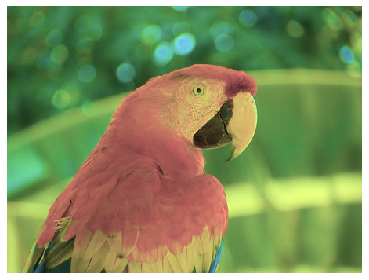

In [24]:
im = imread("images/parrot.png")     # read mage from disk, provide the correct path
print(im.shape, im.dtype, type(im)) 
# (362, 486, 3) uint8 <class 'numpy.ndarray'>
hsv = color.rgb2hsv(im) # from RGB to HSV color space
hsv[:, :, 1] = 0.5 # change the saturation
im1 = color.hsv2rgb(hsv) # from HSV back to RGB
imsave('images/parrot_hsv.png', (255*im1).astype('uint8')) # save image to disk
im = imread("images/parrot_hsv.png")
plt.axis('off'), plt.imshow(im)
plt.show()

### Using scikit-image's astronaut dataset

The following code block shows how we can load the astronaut image from the scikit-image
library's image datasets, with the data module. The module contains few other popular
datasets, such as cameraman, they can similarly be loaded. The next figure shows the output of the above code.

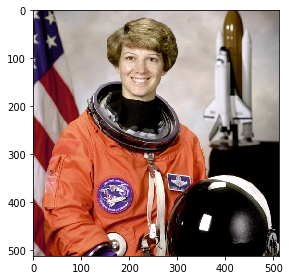

In [26]:
im = data.astronaut()
plt.imshow(im)
plt.show()

### Reading and displaying multiple images at once

We can use scikit-image io module's imread_collection() function to load all images in a
folder having a particular pattern in the file name and display them simultaneously with
the imshow_collection() function. The next code block shows an example of reading an
showing an image collection. The next figure shows the output of the above code block.

4


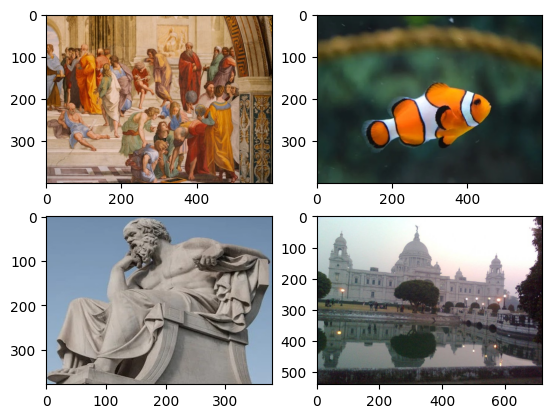

In [235]:
images = imread_collection('images/image_dir/*.jpg')
print(len(images)) # print number of jpg images in the folder, there were 4 of them
# 4
imshow_collection(images, aspect='auto')
plt.show()

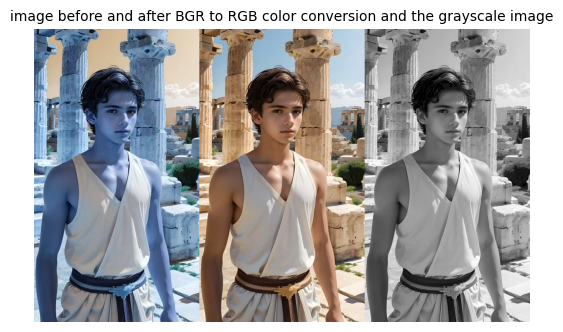

In [281]:
import cv2 
image = cv2.imread('images/model.png') 
image_gray = cv2.imread('images/model.png', cv2.IMREAD_GRAYSCALE) 
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) 
plt.imshow(np.hstack((image, image_rgb,  
           np.repeat(image_gray[..., np.newaxis], 3, axis=-1)))), plt.axis('off') 
plt.title('image before and after BGR to RGB color conversion and the grayscale image', size=10) 
plt.show() 

In [282]:
cv2.imwrite('images/model_yuv.png', cv2.cvtColor(image_rgb,     
                                    cv2.COLOR_RGB2YUV)) 

True

Frame 5 shape: (512, 512, 4)
Frame 6 shape: (512, 512, 4)
Frame 26 shape: (512, 512, 4)
Frame 30 shape: (512, 512, 4)
Frame 31 shape: (512, 512, 4)


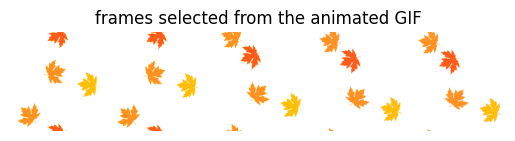

In [283]:
import imageio 
 
gif_path = 'images/leaves.gif' 
 
np.random.seed(3) 
images = [] 
with imageio.get_reader(gif_path) as reader: 
    for i, frame in enumerate(reader): 
        if len(images) < 5: 
            if np.random.rand() > 0.75: 
                images.append(frame) 
                print(f"Frame {i + 1} shape: {frame.shape}") 
plt.imshow(np.hstack(images)), plt.axis('off') 
plt.title('frames selected from the animated GIF', size=12) 
plt.show() 

### Block views on images

This example illustrates the use of view_as_blocks from skimage.util(). Block views can be incredibly useful when one wants to perform local operations on non-overlapping image patches.

Let's virtually ‘slice’ the grayscale input image into square blocks. Then, on each block, we either pool the mean, the max or the median value of that block. The results are displayed altogetherthe original image.

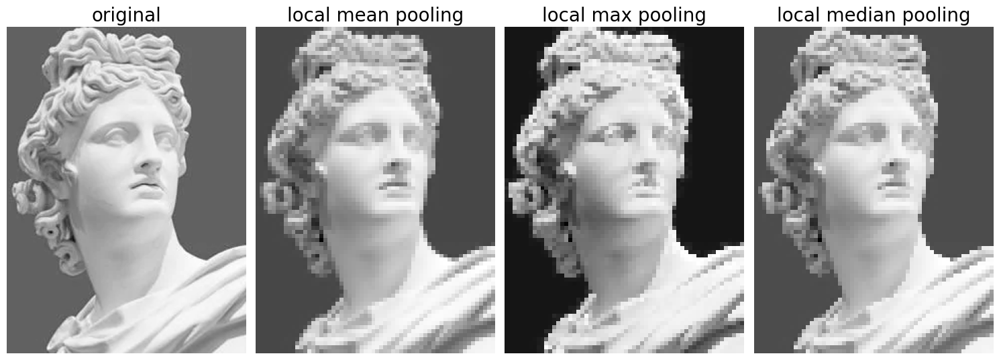

In [220]:
# get astronaut from skimage.data in grayscale
im = color.rgb2gray(imread('images/sculpture.png')[...,:3])

# size of blocks
block_shape = (4, 4) #(8, 8)

# see astronaut as a matrix of blocks (of shape block_shape)
view = view_as_blocks(im, block_shape)

# collapse the last two dimensions in one
flatten_view = view.reshape(view.shape[0], view.shape[1], -1)

# resampling the image by taking either the `mean`,
# the `max` or the `median` value of each blocks.
mean_view = np.mean(flatten_view, axis=2)
max_view = np.max(flatten_view, axis=2)
median_view = np.median(flatten_view, axis=2)

plt.figure(figsize=(15,7))
plt.gray()
plt.subplot(141), plt.axis('off'), plt.title('original', size=20), plt.imshow(im)
plt.subplot(142), plt.axis('off'), plt.title('local mean pooling', size=20), plt.imshow(mean_view)
plt.subplot(143), plt.axis('off'), plt.title('local max pooling', size=20), plt.imshow(max_view)
plt.subplot(144), plt.axis('off'), plt.title('local median pooling', size=20), plt.imshow(median_view)
plt.tight_layout()
plt.show()

In [9]:
im = Image.open("images/parrot.png")
print(im.mode)
# RGB
im.save("images/parrot.jpg")
#im = Image.open("images/parrot.jpg")
#im2.show()

RGB


But if the PNG file is of RGBA mode, we need to convert it to RGB mode before we save the
as JPG, otherwise it will give an error. The next code blog shows how to first convert and
then save.

In [10]:
im = Image.open("images/hill_alpha.png")
print(im.mode)
# RGBA
im.convert('RGB').save("images/hill.jpg") # first convert to RGB mode
#im = Image.open("images/hill.jpg")
#im.show()

RGBA


### Image Types (modes)

An image can be of following different types:

* Single channel images (each pixel is represented by a single value) 
    - Binary (monochrome) image (each pixel is represented by a single 0-1 bit) 
    - Gray-level image (each pixel can be represented with 8-bits and can have value typically in the range 0-255)
* Multi-channel images (each pixel is represented by a tuple of values) 
    - 3-channel images, e.g., 
        * RGB images - each pixel is represented by a 3-tuple (r,g,b) values, representing red, green and blue
channel color values for every pixel.
        * HSV images - each pixel is represented by a 3-tuple (h,s,v) values, representing hue (color), saturation
(colorfulness: how much the color is mixed with white) and value (brightnessL how much the color is
mixed with black) channel color values for every pixel. The HSV model describes colors in a similar
manner as the human eye tends to perceive colors. 
    - 4-channel images (e.g., RGBA images - each pixel is represented by a 3-tuple (r,g,b,α) values, the last channel representing the
transparency).

### Converting from one image mode to another

We have seen how we can use the `convert()` method from `PIL.Image` to convert a RGB color image to grayscale. Let's now see how we can do it with `scikit-image`. We can convert an RGB image to a gray-scale image while reading the image itself. The following code exactly does that using `skimage.imread()` function by setting the parameter `as_gray` to value `True`. As you can see, the image is 2 dimensional now and it no logner has the color channel.

In [11]:
im = imread("images/parrot.png", as_gray=True)
print(im.shape)
#(362L, 486L)

(340, 453)


Note that we can lose some information while converting to gray scale for some colored images, the following
code shows such an example with the Ishihara plates, used to detect color-blindness. This time the function
`rgb2gray()` is used from the color module and both the color and the gray-scale images are shown side by
side. As can be seen, the letter 8 is almost not visible in the gray-scale version. The next figure shows the output of the code snippet, the colored image and gray-scale image obtained from it.

(344, 358, 3) (344, 358)


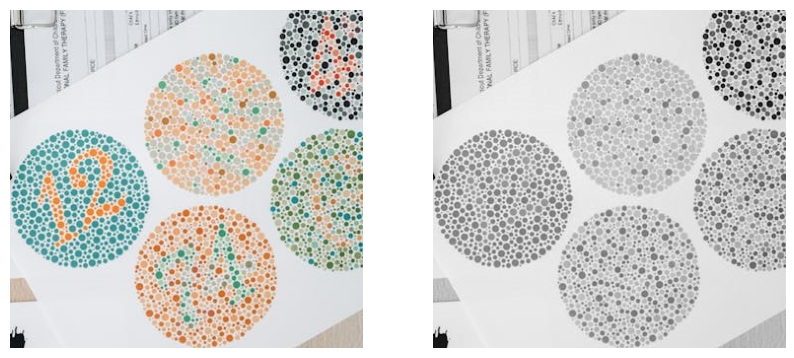

In [18]:
im = imread("images/ishihara.jpeg")
im_g = color.rgb2gray(im)
print(im.shape, im_g.shape)
plt.figure(figsize=(10,5))
plt.subplot(121), plt.imshow(im, cmap='gray'), plt.axis('off')
plt.subplot(122), plt.imshow(im_g, cmap='gray'), plt.axis('off')
plt.show()

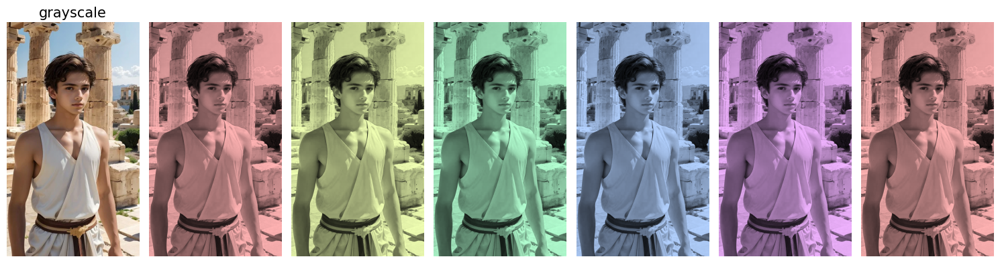

In [292]:
def colorize(im, hue, saturation=1):     
    hsv = color.rgb2hsv(im) 
    hsv[:, :, 1] = saturation 
    hsv[:, :, 0] = hue 
    return color.hsv2rgb(hsv) 

from skimage.color import rgba2rgb
im = rgba2rgb(imread('images/model.png'))
hue_rotations = np.linspace(0, 1, 6) 
fig, axes = plt.subplots(nrows=1, ncols=7, sharex=True, sharey=True, \
                                                       figsize=(15,4)) 
axes[0].imshow(im), axes[0].set_axis_off() 
axes[0].set_title('grayscale', size=15) 
for ax, hue in zip(axes.flat[1:], hue_rotations): 
    tinted_im = colorize(im, hue, saturation=0.3) 
    ax.imshow(tinted_im, vmin=0, vmax=1) 
    ax.set_axis_off() 
fig.tight_layout() 

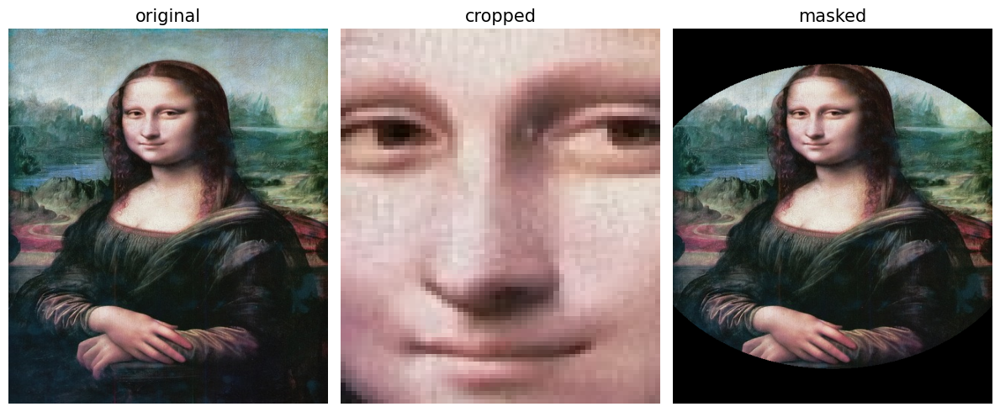

In [308]:
import numpy as np 
import matplotlib.pylab as plt 
 
lena = plt.imread("images/monalisa.jpg") # read image from disk as numpy ndarray 
lx, ly = lena.shape[:2] 
 
cropped_lena = lena[120:210, 160:220, :]  # crop a region 
X, Y = np.ogrid[0:lx, 0:ly] 
mask = (X - lx / 2) ** 2 + (Y - ly / 2) ** 2 > lx * ly / 4 
masked_lena = lena.copy() 
masked_lena[mask,:] = 0 # masks 
 
plt.figure(figsize=(12,5)) 
plt.subplot(131), plt.imshow(lena, aspect='auto'), plt.axis('off'), plt.title('original', size=15) 
plt.subplot(132), plt.imshow(cropped_lena, aspect='auto'), plt.axis('off'), plt.title('cropped', size=15) 
plt.subplot(133), plt.imshow(masked_lena, aspect='auto'), plt.axis('off'), plt.title('masked', size=15) 
plt.tight_layout() 
plt.show() 


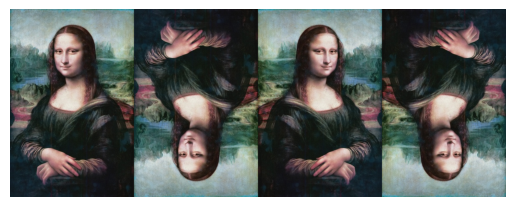

In [310]:
v_flipped_lena = np.flipud(lena)  # Vertical flip 
h_flipped_lena = np.fliplr(lena)  # horizontal flip 
vh_flipped_lena = np.fliplr(v_flipped_lena) #both Vertical & horizontal flip 
plt.imshow(np.hstack((lena, v_flipped_lena, h_flipped_lena,  \
                                            vh_flipped_lena))) 
plt.axis('off') 
plt.show() 


640.0 -100
[[ 6.36396103e-01 -6.36396103e-01  6.40000000e+02]
 [ 6.36396103e-01  6.36396103e-01 -1.00000000e+02]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
[[   0.7856742     0.7856742  -424.26406871]
 [  -0.7856742     0.7856742   581.39890898]
 [   0.            0.            1.        ]]


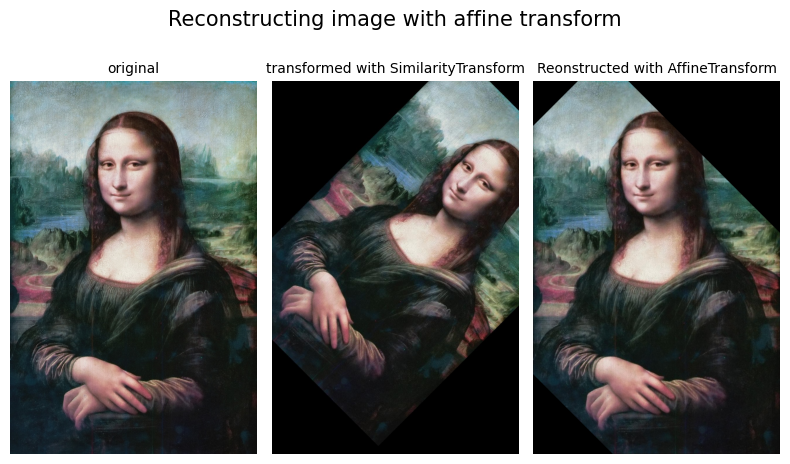

In [332]:
from skimage.transform import SimilarityTransform 

def plot_image(im, title='', fontsize=20): 
     plt.imshow(im), plt.axis('off'), plt.title(title, size=fontsize) 
         
def plot_images(images, titles, suptitle='', fontsize=20, \
                                supfontsize=22, figsize=(15,7)): 
    n = len(images) 
    plt.figure(figsize=figsize) 
    plt.gray() 
    for i in range(n): 
        plt.subplot(1,n,i+1), plot_image(images[i], titles[i], fontsize) 
    plt.suptitle(suptitle, size=supfontsize) 
    plt.tight_layout() 
    plt.show()

im = plt.imread('images/monalisa.jpg')


from skimage.transform import warp 
 
def translate(xy, t_x, t_y): 
    xy[:, 0] -= t_x 
    xy[:, 1] -= t_y 
    return xy 
 
im = imread('images/monalisa.jpg') 
im_trans = warp(im, translate, map_args={'t_x':-100, 't_y':50}, order=1) # create a dictionary for translation parameters 

def rotate(xy, theta): 
    theta = np.deg2rad(theta) #np.pi/180*theta # in radian 
    xy[:, 0], xy[:, 1] = xy[:, 0]*np.cos(theta) - xy[:,1]*np.sin(theta),   \
                         xy[:, 0]*np.sin(theta) + xy[:,1]*np.cos(theta) 
    return xy 
 
# create a dictionary for rotation parameters 
im_rot = warp(im, rotate, map_args={'theta':10})  

t_x, t_y = im.shape[0]/2, -100 
print(t_x, t_y) 
tform = SimilarityTransform(scale=0.9, rotation=np.pi/4,  
                            translation=(t_x, t_y)) 
im_sim = warp(im, tform.inverse) 
plt.imsave('images/monalisa_sim.jpg', im_sim) # save the transformed image 
 
# Get the transformation matrix 
matrix_sim = tform.params 
print(matrix_sim) 

im_tformed = imread('images/monalisa_sim.jpg') 
tform = AffineTransform(np.linalg.inv(matrix_sim)) 
im_recon_affine = warp(im_tformed, tform.inverse) 
matrix_affine = tform.params 
print(matrix_affine) 

plot_images([im, im_tformed, im_recon_affine],\
            ['original', 'transformed with SimilarityTransform', \
             'Reonstructed with AffineTransform'],\
            'Reconstructing image with affine transform', \
            fontsize=10, supfontsize=15, figsize=(8,5)) 

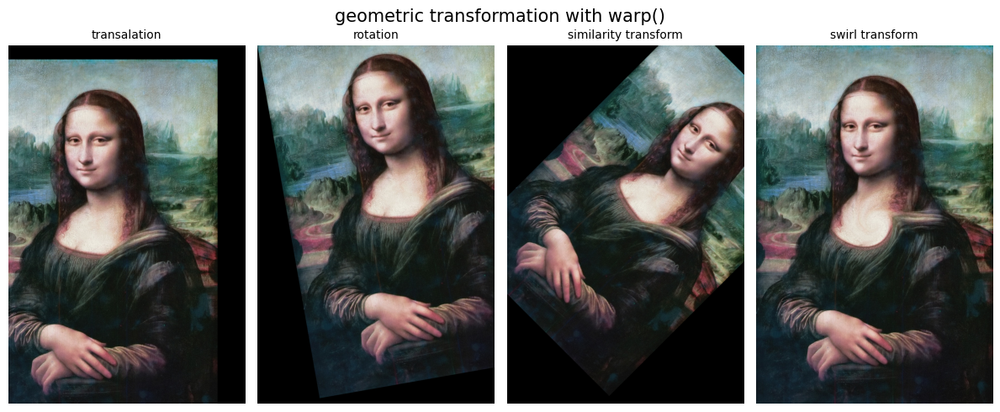

In [334]:
from skimage.transform import swirl 
 
im_swirled = swirl(im, rotation=0, strength=5, radius=300) 
 
plot_images([im_trans, im_rot, im_sim, im_swirled], \
   ['transalation', 'rotation', 'similarity transform', 'swirl transform'],\
   'geometric transformation with warp()', fontsize=10, supfontsize=15, figsize=(12,5))

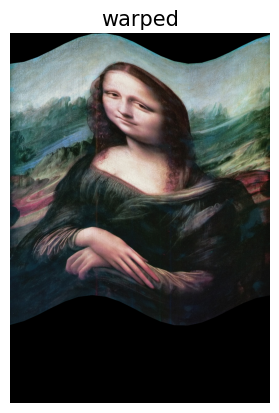

In [338]:
from skimage.transform import PiecewiseAffineTransform 
 
rows, cols = im.shape[0], im.shape[1] 
 
src_cols = np.linspace(0, cols, 20) 
src_rows = np.linspace(0, rows, 20) 
src_rows, src_cols = np.meshgrid(src_rows, src_cols) 
src = np.dstack([src_cols.flat, src_rows.flat])[0] 
 
# add sinusoidal oscillation to row coordinates 
dst_rows = src[:,1] - np.cos(np.linspace(0, 3*np.pi, src.shape[0]))*50 
dst_cols = src[:, 0] 
dst_rows *= 1.5 
dst_rows -= 1.5 * 50 
dst = np.vstack([dst_cols, dst_rows]).T 
 
# Estimate the transformation using PiecewiseAffineTransform 
tform = PiecewiseAffineTransform() 
tform.estimate(src, dst) 
out_rows = im.shape[0] - 1.5 * 50 
out_cols = cols 
 
# Apply the transformation to warp the image 
out = warp(im, tform, output_shape=(out_rows, out_cols)) 
 
plt.imshow(out), plt.axis('off'), plt.title('warped', size=15) 
plt.show() 

(1280, 846, 3) (30, 171, 3)


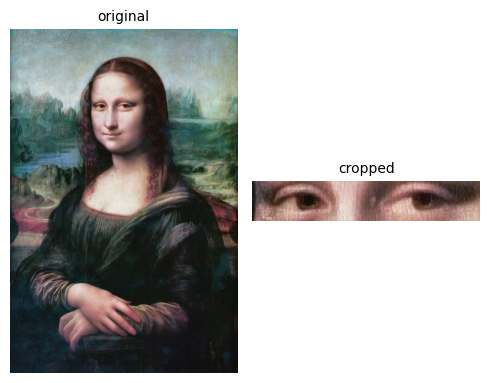

In [354]:
from skimage.util import crop 
 
im = imread('images/monalisa.jpg') 
im_cropped = crop(im, ((275, 975), (300, 375), (0,0)), copy=False) 
 
print(im.shape, im_cropped.shape) 
# (220, 220, 3) (70, 120, 3) 
 
plot_images([im, im_cropped], ['original', 'cropped'], fontsize=10, supfontsize=15, figsize=(5,4)) 


In [ ]:
im = imread('images/monalisa.jpg', True) 
x,y = np.meshgrid(np.float32(np.arange(im.shape[1])), \
      np.float32(np.arange(im.shape[0]))) 
y = y + 20*np.sin(x/15) 
distorted = ndimage.map_coordinates(im, [y.ravel(),x.ravel()]) 
plt.imshow(distorted.reshape(im.shape)), plt.axis('off') 
plt.show()

In [314]:
import numpy as np 
import gradio as gr 
 
def sepia(input_img): 
    sepia_filter = np.array([ 
        [0.393, 0.769, 0.189],  
        [0.349, 0.686, 0.168],  
        [0.272, 0.534, 0.131]]) 
    sepia_img = input_img.dot(sepia_filter.T) 
    sepia_img /= sepia_img.max() 
    return sepia_img 
 
iface = gr.Interface(sepia, gr.Image(shape=(200, 200)), "image") 
iface.launch() 

Running on local URL:  http://127.0.0.1:7860

To create a public link, set `share=True` in `launch()`.


### Adding alpha channel / transparency to a png image

RGB


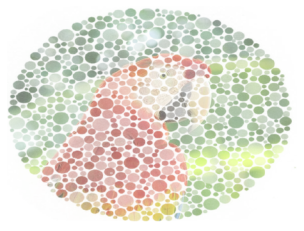

In [77]:
im = Image.open('images/parrot.png')
print(im.mode)
im = im.convert('RGBA')
im_alpha = ImageOps.invert(Image.open("images/Ishihara.png").convert('L'))
im.putalpha(im_alpha.resize((im.width, im.height)))
im.save('images/parrot_alpha.png')
plt.imshow(im), plt.axis('off')
plt.show()

### Some Color spaces (channels)

The following represents a few popular channels / color spaces for an image.

* RGB
* HSV
* XYZ
* YUV
* YIQ
* YPbPr
* YCbCr
* YDbDr

We can use affine mappings to go from one color-space to another. The following matrix
represent the linear mapping from RGB to YIQ color space.

![](images/rgb_yiq.png)

### Converting from one color space to another

We can convert from one color space to another using library functions, for example, the
following code converts an RGB color space to HSV color space image. The next figure shows the parrot HSV image, created using the code.

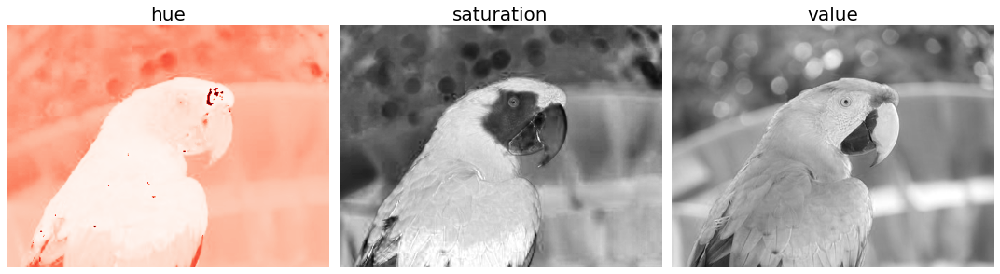

In [236]:
im = imread("images/parrot.png")
im_hsv = color.rgb2hsv(im)
plt.figure(figsize=(15,6))
plt.gray()
plt.subplot(131), plt.axis('off'), plt.title('hue', size=20), plt.imshow(im_hsv[...,0], cmap='Reds')
plt.subplot(132), plt.axis('off'), plt.title('saturation', size=20), plt.imshow(im_hsv[...,1])
plt.subplot(133), plt.axis('off'), plt.title('value', size=20), plt.imshow(im_hsv[...,2])
plt.tight_layout()
plt.show()
#show()

Similarly, we can convert the image to YUV color-space using the following code.

In [229]:
im_yuv = color.rgb2yuv(im)
imsave('images/parrot_yuv.png', (255*im_yuv).astype(np.uint8))

The next figure shows the parrot YUV image, created using the above code and the original red, green and blue channels from the RGB colorspace.

![](images/parrot_yuv_channels.png)
![](images/parrot_rgb_channels.png)

### Color Enhancement in HSV colorspace

Let's now change the hue, saturation and value channels in the HSV colorspace represetation of an image (e.g, multiply the corresponding channel values by a factor with the function `multiply_channel_hsv()` and clipping values above $1$ to $1$) using the following code snippet. Obesrve how the color of the image is enhanced when the saturation and value channels are increased, respectively. We need to convert the RGB image to HSV, modify one of the channels and convert in back to RGB. 

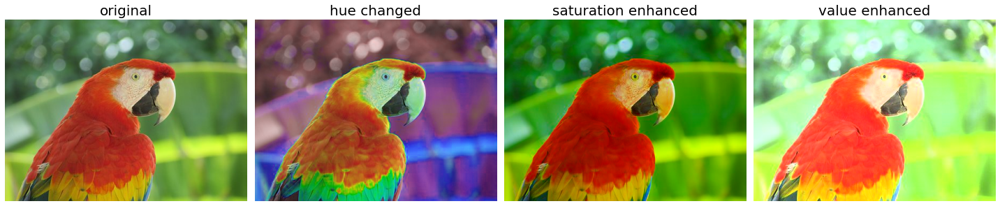

In [48]:
def multiply_channel_hsv(im, i, f):
    im_hsv = color.rgb2hsv(im)
    im_hsv[...,i] = np.minimum(f*im_hsv[...,i], 1)
    return color.hsv2rgb(im_hsv)

im = imread('images/parrot.png')
plt.figure(figsize=(20,7))
plt.subplot(141), plt.axis('off'), plt.title('original', size=20), plt.imshow(im)
plt.subplot(142), plt.axis('off'), plt.title('hue changed', size=20), plt.imshow(multiply_channel_hsv(im, 0, 3))
plt.subplot(143), plt.axis('off'), plt.title('saturation enhanced', size=20), plt.imshow(multiply_channel_hsv(im, 1, 2.5))
plt.subplot(144), plt.axis('off'), plt.title('value enhanced', size=20), plt.imshow(multiply_channel_hsv(im, 2, 2))
plt.tight_layout()
plt.show()

### Tinting gray-scale images in HSV colorspace

#### Displaying the Hue Gradient

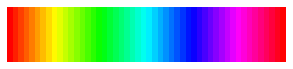

In [55]:
hue_gradient = np.linspace(0, 1)
hsv = np.ones(shape=(1, len(hue_gradient), 3), dtype=float)
hsv[:, :, 0] = hue_gradient
all_hues = color.hsv2rgb(hsv)

fig, ax = plt.subplots(figsize=(5, 2))
# Set image extent so hues go from 0 to 1 and the image is a nice aspect ratio.
ax.imshow(all_hues, extent=(0 - 0.5 / len(hue_gradient),
                            1 + 0.5 / len(hue_gradient), 0, 0.2))
ax.set_axis_off()

#### Colorize a grayscale image with Vintage look

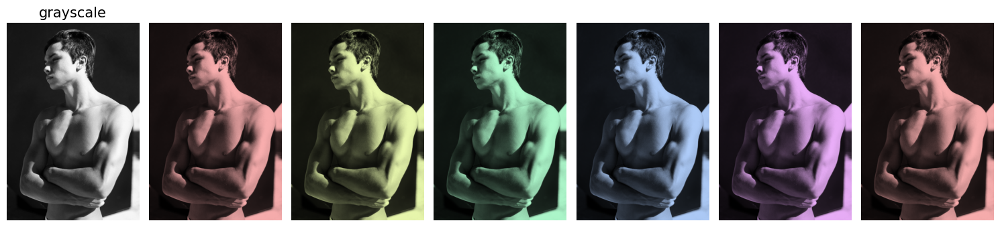

In [166]:
def colorize(im, hue, saturation=1):
    """ Add color of the given hue to an RGB im.

    By default, set the saturation to 1 so that the colors pop!
    """
    hsv = color.rgb2hsv(im)
    hsv[:, :, 1] = saturation
    hsv[:, :, 0] = hue
    return color.hsv2rgb(hsv)

im = imread('images/man.jpg')
hue_rotations = np.linspace(0, 1, 6)
fig, axes = plt.subplots(nrows=1, ncols=7, sharex=True, sharey=True, figsize=(15,4))
axes[0].imshow(im), axes[0].set_axis_off(), axes[0].set_title('grayscale', size=15)
for ax, hue in zip(axes.flat[1:], hue_rotations):
    # Turn down the saturation to give it that vintage look.
    tinted_im = colorize(im, hue, saturation=0.3)
    ax.imshow(tinted_im, vmin=0, vmax=1)
    ax.set_axis_off()
fig.tight_layout()

### Implementing Color Pop Effect with Hue filtering and Saturation Modfication

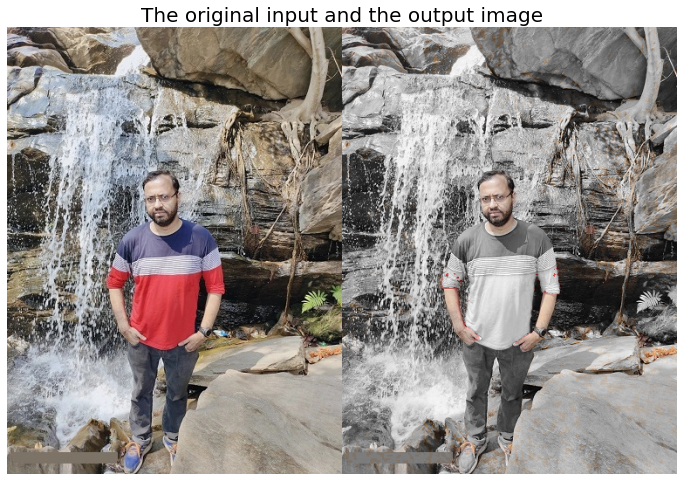

In [234]:
im = imread('images/me.jpg')
im = im / im.max()
im_hsv = color.rgb2hsv(im)
im_hsv[im_hsv[...,0] > 0.09,1] = 0
im_out = color.hsv2rgb(im_hsv)
plt.figure(figsize=(12,12))
plt.imshow(np.hstack((im,im_out))), plt.axis('off')
plt.title('The original input and the output image', size=20)
plt.show()

### Color Enhancement in RGB Colorspace

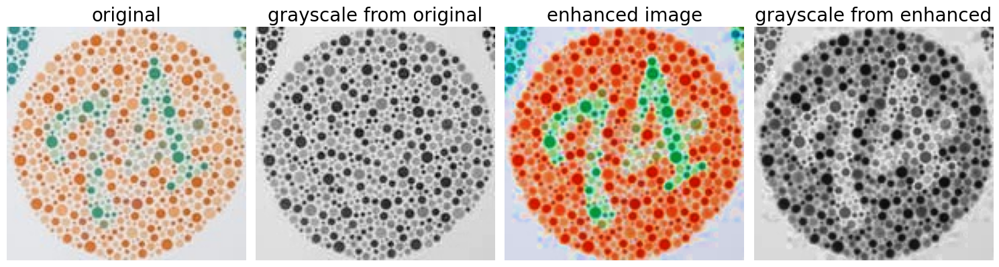

In [22]:
def enhance_rgb(im, f=4):
    im = im.copy()
    r, g, b = im[...,0], im[...,1], im[...,2]
    m = np.maximum(np.maximum(r, g), b)
    im[...,0], im[...,1], im[...,2] = (r/m)**f*m, (g/m)**f*m, (b/m)**f*m
    return im

im = imread('images/ishihara2.png')[...,:3]
im_en = enhance_rgb(im)
plt.figure(figsize=(15,5))
plt.gray()
plt.subplot(141), plt.axis('off'), plt.title('original', size=20), plt.imshow(im)
plt.subplot(142), plt.axis('off'), plt.title('grayscale from original', size=20), plt.imshow(color.rgb2gray(im))
plt.subplot(143), plt.axis('off'), plt.title('enhanced image', size=20), plt.imshow(im_en)
plt.subplot(144), plt.axis('off'), plt.title('grayscale from enhanced', size=20), plt.imshow(color.rgb2gray(im_en))
plt.tight_layout()
plt.show()

### Color Shifting in CIELab colorspace

Now let's change the luminosity and the color (a, b) channels in the **Lab** colorspace represetation of an image (e.g, add the corresponding channel values by a given shift value $x$ with the function `add_channel_lab()`) using the following code snippet. Obesrve how the color of the image is shifted when the **a** channel values are increased by $10$ (resulting in a *red-tinted* image) and **b** channel values are decreased by $25$ (resulting in a *cooled* image), respectively. When the **L** channel values are increased, the brightness of the image increases instead, as can be seen from the next figure. We need to convert the RGB image to LAB, 0modify one of the channels and convert in back to RGB.

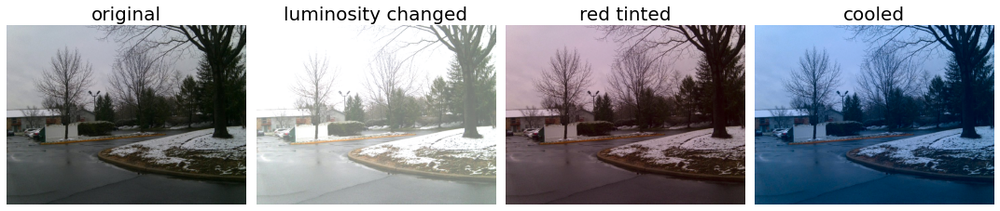

In [160]:
def add_channel_lab(im, i, x):
    im_lab = color.rgb2lab(im)
    im_lab[...,i] = x + im_lab[...,i]
    return color.lab2rgb(im_lab)

im = imread('images/scene.jpg')
plt.figure(figsize=(15,5))
plt.subplot(141), plt.axis('off'), plt.title('original', size=20), plt.imshow(im)
plt.subplot(142), plt.axis('off'), plt.title('luminosity changed', size=20), plt.imshow(add_channel_lab(im, 0, 50))
plt.subplot(143), plt.axis('off'), plt.title('red tinted', size=20), plt.imshow(add_channel_lab(im, 1, 10))
plt.subplot(144), plt.axis('off'), plt.title('cooled', size=20), plt.imshow(add_channel_lab(im, 2, -25))
plt.tight_layout()
plt.show()

### Skin color detection with HSV and YCbCr Colorspace

In [ ]:
def detect_skin_color(img): 
    #converting from gbr to hsv color space 
    img_HSV = cv2.cvtColor(img, cv2.COLOR_BGR2HSV) 
    #skin color range for hsv color space  
    HSV_mask = cv2.inRange(img_HSV, (0, 15, 0), (17,170,255))  
    HSV_mask = cv2.morphologyEx(HSV_mask, cv2.MORPH_OPEN,              
				             np.ones((3,3), np.uint8)) 
    #converting from gbr to YCbCr color space 
    img_YCrCb = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb) 
    YCrCb_mask = cv2.inRange(img_YCrCb, (0, 135, 85), (255,180,135)) 
                              #skin color range for YCbCr color space  
    YCrCb_mask = cv2.morphologyEx(YCrCb_mask, cv2.MORPH_OPEN,  
                                          np.ones((3,3), np.uint8)) 
    #merge skin detection (YCbCr and hsv) 
    global_mask = np.bitwise_and(YCrCb_mask,HSV_mask) 
    global_mask = cv2.medianBlur(global_mask,3) 
    global_mask = cv2.morphologyEx(global_mask, cv2.MORPH_OPEN, \  
                                   np.ones((4,4), np.uint8)) 
 
    img_RGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 
    out_HSV = cv2.cvtColor(img & color.gray2rgb(HSV_mask),  \  
                                           cv2.COLOR_BGR2RGB) 
    out_YCrCb = cv2.cvtColor(img & color.gray2rgb(YCrCb_mask), \  
                                           cv2.COLOR_BGR2RGB) 
    out_global = cv2.cvtColor(img & color.gray2rgb(global_mask), \ 
                                           cv2.COLOR_BGR2RGB)  
    return img_RGB, out_HSV, out_YCrCb, out_global 
 
img = cv2.imread("images/cycling.png") 
img_RGB, out_HSV, out_YCrCb, out_global = detect_skin_color(img) 
 
plt.figure(figsize=(20,7)) 
plt.imshow(np.hstack((img_RGB, out_HSV, out_YCrCb, out_global))), plt.axis('off') 
plt.title('Skin color detection in HSV, YCbCr and mixed colorspaces',  
                                                             size=25) 
plt.show()  

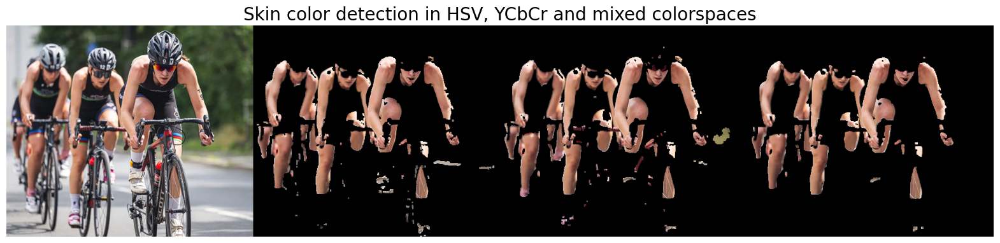

In [161]:
#Open a simple image
img = cv2.imread("images/cycling.png")

#converting from gbr to hsv color space
img_HSV = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
HSV_mask = cv2.inRange(img_HSV, (0, 15, 0), (17,170,255)) #skin color range for hsv color space 
HSV_mask = cv2.morphologyEx(HSV_mask, cv2.MORPH_OPEN, np.ones((3,3), np.uint8))

#converting from gbr to YCbCr color space
img_YCrCb = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
YCrCb_mask = cv2.inRange(img_YCrCb, (0, 135, 85), (255,180,135)) #skin color range for YCbCr color space 
YCrCb_mask = cv2.morphologyEx(YCrCb_mask, cv2.MORPH_OPEN, np.ones((3,3), np.uint8))

#merge skin detection (YCbCr and hsv)
global_mask = np.bitwise_and(YCrCb_mask,HSV_mask)
global_mask = cv2.medianBlur(global_mask,3)
global_mask = cv2.morphologyEx(global_mask, cv2.MORPH_OPEN, np.ones((4,4), np.uint8))

img_RGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
out_HSV = cv2.cvtColor(img & color.gray2rgb(HSV_mask), cv2.COLOR_BGR2RGB)
out_YCrCb = cv2.cvtColor(img & color.gray2rgb(YCrCb_mask), cv2.COLOR_BGR2RGB)
out_global = cv2.cvtColor(img & color.gray2rgb(global_mask), cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,7))
plt.imshow(np.hstack((img_RGB, out_HSV, out_YCrCb, out_global))), plt.axis('off')
plt.title('Skin color detection in HSV, YCbCr and mixed colorspaces', size=20)
plt.show()

### Data structures to store images

As we have already discussed, `PIL` uses Image object to store an image, whereas `scikit-image` uses `numpy`
ndarray data structure to store the image data. The next section describes how to convert between these two
data structures.

### Converting the image data structures

The following code block shows how to convert from `PIL` Image object to a `numpy` ndarray
(to be consumed by scikit-image).

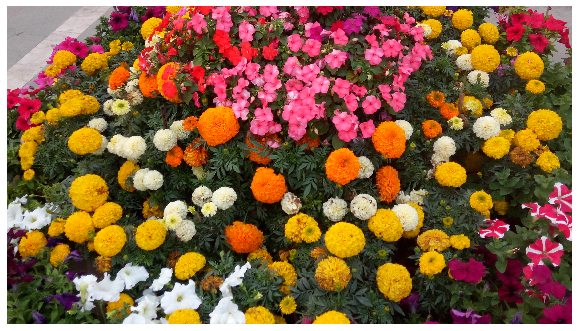

In [3]:
im = Image.open('images/flowers.jpg') # read image into an Image object with PIL
im = np.array(im) # create a numpy ndarray from the Image object
plt.figure(figsize=(10,5))
plt.imshow(im) # use skimage imshow to display the image
plt.axis('off')
plt.show()

The following code block shows how to convert from `numpy` ndarray to a `PIL` Image object.
When run, the code shows the same output as the above figure.

In [ ]:
im = imread('images/flowers.png') # read image into numpy ndarray with skimage
im = Image.fromarray(im) # create a PIL Image object from the numpy ndarray
#im.show() # display the image with PIL Image.show() method

### Basic Image Manipulations

Different python libraries can be used for basic image manipulation. Almost all the libraries
store an image in `numpy` `ndarray` (2D array for gray-scale, 3D array for RGB image, for
example). The following image shows the positive x and y directions (origin being the left
top corner of the image 2D-array) for the colored image lena.

![](images/mona_dir.jpg)

There are many different types of image manipulations that can be performed on digital images, including:

* Cropping: Removing parts of the image to focus on a particular subject or to change the composition.

* Resizing: Changing the dimensions of the image to make it larger or smaller.

* Rotating: Changing the orientation of the image.

* Color adjustment: Adjusting the color balance, saturation, and contrast of the image.

* Sharpening: Enhancing the details in the image to make it appear sharper.

* Blurring: Softening the details in the image to make it appear smoother.

* Adding text: Adding text to the image for captions or graphic design purposes.

* Removing objects: Removing unwanted elements or distractions from the image.

* Cloning: Copying parts of the image and pasting them elsewhere to create duplicates or fill in gaps.

* Merging: Combining multiple images into one composite image.

* Warping: Distorting the image to change its shape or perspective.

* Filter effects: Applying filters to the image to create different visual effects, such as sepia or black and white.

We shall be implementing many of the techniques from the above list with different `python` libraries in this section.

## Image Manipulations with numpy 


### with array slicing

The next code block shows how slicing and masking with numpy arrays can be used to create
a circular mask on the lena image.

[100 166 188]
  C_CONTIGUOUS : True
  F_CONTIGUOUS : False
  OWNDATA : False
  WRITEABLE : False
  ALIGNED : True
  WRITEBACKIFCOPY : False



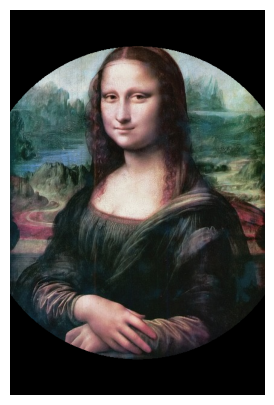

In [94]:
lena = mpimg.imread("images/monalisa.jpg") # read the image from disk as a numpy ndarray
lx, ly = lena.shape[:2]
print(lena[0, 40])
#print(lena[10:13, 20:23,0:1]) # slicing
X, Y = np.ogrid[0:lx, 0:ly]
mask = (X - lx / 2) ** 2 + (Y - ly / 2) ** 2 > lx * ly / 4
print(lena.flags)
lena = lena.copy()
lena[np.where(mask)] = 0 # masks
plt.figure(figsize=(5,5))
plt.imshow(lena), plt.axis('off')
plt.show()

### Simple Image Morphing: α-blending of two images using cross-dissolving

The following code block shows how to start from one face image (image1 being the face of
Messi) and end into another image (image2 being the face of Ronaldo) by using a linear
combination of the two image numpy ndarrays given by $(1-\alpha).image_1+\alpha.image_2$ and iteratively increasing α from $0$ to $1$. The next figure shows the sequence of α-blended images created using the above code, by cross-dissolving
Messi's face image into Ronaldo's. As can be seen from the sequence of intermediate images, the face
morphing with simple blending is not very smooth. In the upcoming chapters we shall see more advanced
techniques for image morphing.

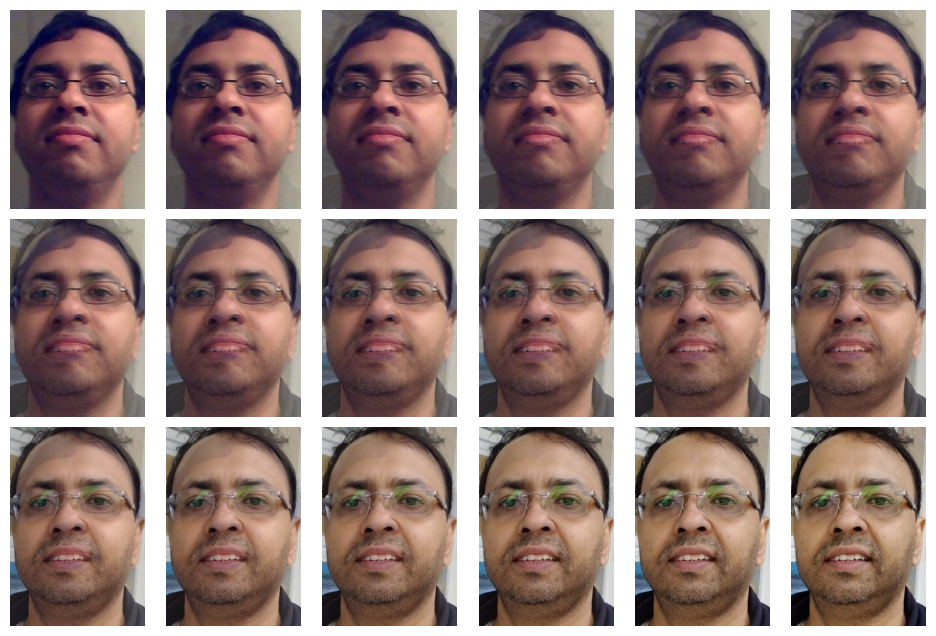

In [81]:
im1 = mpimg.imread("images/me_young.jpg")
im2 = mpimg.imread("images/me_now.jpg")
im1, im2 = im1 / im1.max(), im2 / im2.max()
i = 1
plt.figure(figsize=(12,8))
for alpha in np.linspace(0,1,18):
    plt.subplot(3,6,i), plt.imshow((1-alpha)*im1 + alpha*im2), plt.axis('off')
    i += 1
plt.subplots_adjust(wspace=0.05, hspace=0.05)
plt.show()

### Dividing two images to remove illumination pattern

Dividing one image by another can be used to enhance certain features of the image. Consider the following example with `np.divide()`, you can use the `cv2.divide()` function from `opencv-python` too.

In [248]:
img = cv2.imread('images/board.jpg', 0)
plt.imsave('images/board_illum_pat.png', img/img.max()*img2/img2.max())

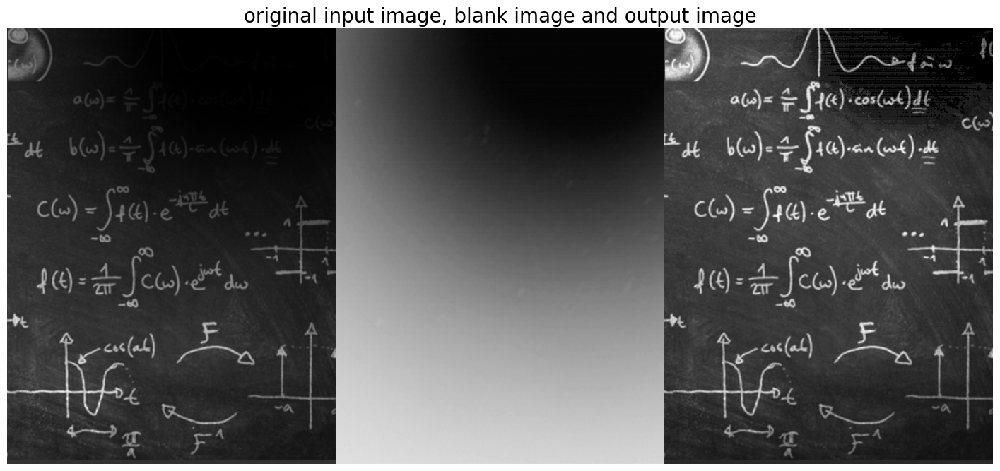

In [249]:
# Load the two images
img1 = cv2.imread('images/board_illum_pat.png', 0)
img2 = cv2.imread('images/pattern.png', 0)

# Divide the two images
out = np.divide(img1.astype(float), img2.astype(float)+0.001)
out = out / out.max()
out = (255*out).astype('uint8')

# Display the original and enhanced images
plt.figure(figsize=(18,9))
plt.gray()
plt.imshow(np.hstack((img1, img2, out))), plt.axis('off')
plt.title('original input image, blank image and output image', size=20)
plt.show()

### Applying Sepia Color Filter 

Speia toen is a brownish-yellow tint that gives an image an old-fashioned or vintage look. The following code snippets implements a function `sepia_filter()` that takes an input RGB color image (pixel value normalized between [0,1]) and applies sepia tone (filter) to the image, using `numpy` vectorized operation for each color channel. The result is a new image with a warm, vintage look, as seen in the next figure.

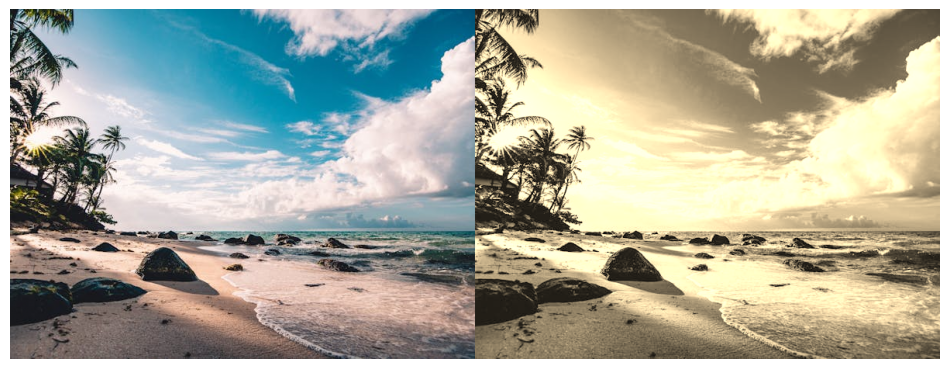

In [187]:
def sepia_filter(im):
    R, G, B = im[...,0], im[...,1], im[...,2]
    im_out = im.copy() 
    im_out[...,0] = 0.393 * R + 0.769 * G + 0.189 * B
    im_out[...,1]  = 0.349 * R + 0.686 * G + 0.168 * B
    im_out[...,2]  = 0.272 * R + 0.534 * G + 0.131 * B
    im_out = np.clip(im_out, 0, 1)
    return im_out

im = imread('images/sea_beach.jpeg')
im = im / im.max()
im_out = sepia_filter(im) 
plt.figure(figsize=(12,5))
plt.imshow(np.hstack((im, im_out))), plt.axis('off')
plt.show()

time (np): 0.075505 sec
time (PIL): 1.350692 sec


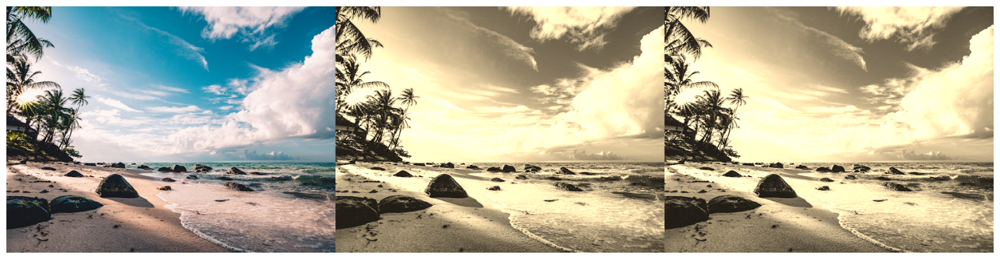

In [186]:
def sepia_filter_PIL(image_path):
    img = Image.open(image_path)
    width, height = img.size
    pixels = img.load() # create the pixel map
    for py in range(height):
        for px in range(width):
            r, g, b = img.getpixel((px, py))
            pixels[px, py] = (min(255, int(0.393 * r + 0.769 * g + 0.189 * b)), \
                              min(255, int(0.349 * r + 0.686 * g + 0.168 * b)), \
                              min(255, int(0.272 * r + 0.534 * g + 0.131 * b)))
    return img


def sepia_filter_np(image_path):
    im = plt.imread(image_path)
    im = im / im.max()    
    R, G, B = im[...,0], im[...,1], im[...,2]
    im_out = np.dstack((0.393 * R + 0.769 * G + 0.189 * B, \
                        0.349 * R + 0.686 * G + 0.168 * B, \
                        0.272 * R + 0.534 * G + 0.131 * B))
    im_out = np.clip(im_out, 0, 1)
    return (255*im_out).astype(np.uint8)

img_path = 'images/sea_beach.jpeg'
start = time()
im_out_np = sepia_filter_np(img_path) 
print('time (np): {:03f} sec'.format(time() - start))
start = time()
im_out_PIL = sepia_filter_PIL(img_path) 
print('time (PIL): {:03f} sec'.format(time() - start))
im, im_out_PIL = plt.imread(img_path), np.array(im_out_PIL)
plt.figure(figsize=(20,7))
plt.imshow(np.hstack((im, im_out_np, im_out_PIL))), plt.axis('off')
plt.show()

## Further Readings / References

1. Digital Image Processing, a book by Rafael C. Gonzalez and Richard E. Woods for image processing concepts.
2. https://web.stanford.edu/class/ee368/handouts.html
3. https://ocw.mit.edu/resources/res-2-006-girls-who-build-cameras-summer-2016/
4. http://scikit-image.org/docs/dev/api/skimage.html
5. https://pillow.readthedocs.io/en/3.1.x/reference/Image.html
6. https://docs.scipy.org/doc/scipy-1.1.0/reference/ndimage.html
7. https://matplotlib.org/gallery
8. http://members.cbio.mines-paristech.fr/~nvaroquaux/formations/scipylecture-notes/advanced/image_processing/index.html
9. http://www.scipy-lectures.org/
10. https://irsa.ipac.caltech.edu/applications/FinderChart/docs/color_enhance.html
11. https://web.cs.wpi.edu/~emmanuel/courses/cs545/S14/slides/lecture09.pdf
12. http://www.eie.polyu.edu.hk/~enyhchan/imagef.pdf
13. http://eeweb.poly.edu/~yao/EL5123/lecture12_ImageWarping.pdf